In [ ]:
# The BEDPEs are given in the GEO

!Rscript GI.R.edges.r -i data/ALL_H3K27ac_Vh.tmm.bedpe -b data/CRE.bed -o data/G/H3K27ac_Vh.tsv
!Rscript GI.R.edges.r -i data/ALL_H3K27ac_30m.tmm.bedpe -b data/CRE.bed -o data/G/H3K27ac_30m.tsv
!Rscript GI.R.edges.r -i data/ALL_H3K27ac_4h.tmm.bedpe -b data/CRE.bed -o data/G/H3K27ac_4h.tsv
!Rscript GI.R.edges.r -i data/ALL_H3K27ac_16h.tmm.bedpe -b data/CRE.bed -o data/G/H3K27ac_16h.tsv
!Rscript GI.R.edges.r -i data/ALL_H3K27ac_72h.tmm.bedpe -b data/CRE.bed -o data/G/H3K27ac_72h.tsv
!Rscript GI.R.edges.r -i data/ALL_H3K4me3_Vh.tmm.bedpe -b data/CRE.bed -o data/G/H3K4me3_Vh.tsv
!Rscript GI.R.edges.r -i data/ALL_H3K4me3_30m.tmm.bedpe -b data/CRE.bed -o data/G/H3K4me3_30m.tsv
!Rscript GI.R.edges.r -i data/ALL_H3K4me3_4h.tmm.bedpe -b data/CRE.bed -o data/G/H3K4me3_4h.tsv
!Rscript GI.R.edges.r -i data/ALL_H3K4me3_16h.tmm.bedpe -b data/CRE.bed -o data/G/H3K4me3_16h.tsv
!Rscript GI.R.edges.r -i data/ALL_H3K4me3_72h.tmm.bedpe -b data/CRE.bed -o data/G/H3K4me3_72h.tsv


Warning message:
In makeGenomicInteractionsFromFile(interactions, type = "bedpe",  :
  Some counts are set to zero, bedpe score field may represent other data
Annotating with cre ...
Warning message:
In annotateInteractions(pet, annotation.features) :
  Some features contain duplicate IDs which will result in duplicate annotations
       category  count
1 distal-distal  47614
2    distal-cre 287762
3       cre-cre 239441
None
Warning message:
In makeGenomicInteractionsFromFile(interactions, type = "bedpe",  :
  Some counts are set to zero, bedpe score field may represent other data
Annotating with cre ...
Warning message:
In annotateInteractions(pet, annotation.features) :
  Some features contain duplicate IDs which will result in duplicate annotations
       category  count
1 distal-distal  47614
2    distal-cre 287762
3       cre-cre 239441
None
Warning message:
In makeGenomicInteractionsFromFile(interactions, type = "bedpe",  :
  Some counts are set to zero, bedpe score field may re

In [45]:
!head data/ALL_H3K27ac_Vh.tmm.bedpe

chr1	712000	713000	chr1	1167000	1168000	chr1:712000-713000,chr1:1167000-1168000	0.29384790885796525
chr1	712000	713000	chr1	742000	743000	chr1:712000-713000,chr1:742000-743000	2.350783270863722
chr1	712000	713000	chr1	757000	758000	chr1:712000-713000,chr1:757000-758000	3.232326997437618
chr1	712000	713000	chr1	792000	793000	chr1:712000-713000,chr1:792000-793000	1.4692395442898263
chr1	712000	713000	chr1	837000	838000	chr1:712000-713000,chr1:837000-838000	0.29384790885796525
chr1	742000	743000	chr1	757000	758000	chr1:742000-743000,chr1:757000-758000	5.58311026830134
chr1	752000	753000	chr1	757000	758000	chr1:752000-753000,chr1:757000-758000	13.810851716324366
chr1	757000	758000	chr1	1167000	1168000	chr1:757000-758000,chr1:1167000-1168000	1.175391635431861
chr1	762000	763000	chr1	792000	793000	chr1:762000-763000,chr1:792000-793000	1.4692395442898263
chr1	812000	813000	chr1	837000	838000	chr1:812000-813000,chr1:837000-838000	1.4692395442898263


In [46]:
import numpy as np
import pandas as pd
import networkx as nx

import pybedtools as bt

from collections import Counter, deque
import pickle
import re
import os

from mycolorpy import colorlist as mcp
import matplotlib.patches as mpatches
import matplotlib.collections as mcol
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib import gridspec
from scipy.stats import shapiro, mannwhitneyu


from adjustText import adjust_text

color1=mcp.gen_color(cmap="Reds",n=10)[-7:-2]
color2=mcp.gen_color(cmap="Greys",n=10)[-7:-2]


colorPalette = {
    "ANDR"    : color1[-1],
    "High"    : color2[-1],
    "Mid-high": color2[-2],
    "Mid-low" : color2[-3],
    "low"     : color2[-4],
    
    "ARcre"   : "#67B95D",
    "cre"     : "#014f86",
    "rnd"     : "#BBBBBB",
    "AR"      : "#999999"
}

MAPty = pickle.load(open('data/MAPty.p', 'rb'))
MAPcl = pickle.load(open('data/MAPcl.p', 'rb'))
MAPgn = pickle.load(open('data/MAPgn.p', 'rb'))

In [47]:
!grep 'chr21:42877586-42882586' data/CRE.bed

chr21	42877586	42882586	chr21:42877586-42882586


In [48]:
DFs[DFs['cre.id2'] == 'chr21:42877586-42882586' ]

,seqnames1,start1,end1,width1,strand1,node.class1,cre.id1,seqnames2,start2,end2,...,name,H3K27ac.30m,H3K27ac.4h,H3K27ac.16h,H3K27ac.72h,H3K4me3.Vh,H3K4me3.30m,H3K4me3.4h,H3K4me3.16h,H3K4me3.72h


In [49]:
DFs = pd.DataFrame()
first = True
for s in ['H3K27ac', 'H3K4me3']:
    for t in ["Vh","30m","4h", "16h","72h"]:
        print(t)
        
        interactions = f"data/G/{s}_{t}.tsv"
        df = pd.read_table(interactions)
        df = df.rename(columns={'counts': f'{s}.{t}'})
        
        if first:
            DFs = df
            first = False
        else:
            DFs[f'{s}.{t}'] = df[f'{s}.{t}']
            
            
            

G = nx.Graph()

for i, row in DFs.iterrows():

    # >>> 1 >>>
    if row["cre.id1"].find("['") != -1:        
        s1 = row["cre.id1"].replace("['", "")
        s1 = s1.replace("']", "")
        s1 = s1.split("', '")
    else:
        s1 = [row["cre.id1"]]

    if row["cre.id2"].find("['") != -1:
        s2 = row["cre.id2"].replace("['", "")
        s2 = s2.replace("']", "")
        s2 = s2.split("', '")
    else:
        s2 = [row["cre.id2"]]

    # <<< 1 <<<
    
    # >>> 2 (3) >>>
    c = {}
    for w in ['H3K27ac.Vh', 'H3K27ac.30m', 'H3K27ac.4h', 'H3K27ac.16h', 'H3K27ac.72h', 'H3K4me3.Vh', 'H3K4me3.30m', 'H3K4me3.4h', 'H3K4me3.16h', 'H3K4me3.72h']:
        c[w] = row[w]

    for s1_ in s1:
        for s2_ in s2:
            

            nc1 = MAPcl[s1_]
            nc2 = MAPcl[s2_]
            G.add_node(s1_, nodeClass=nc1,color=colorPalette[nc1])
            G.add_node(s2_, nodeClass=nc2,color=colorPalette[nc2])
            
            if s1_ == s2_:
                continue
            G.add_edge(s1_, s2_, **c,)
            
    # <<< 2 (3) <<<
# <<< 2 <<<

pickle.dump(G, open('data/G_ALL.p', 'wb'))

Vh
30m
4h
16h
72h
Vh
30m
4h
16h
72h


In [50]:
import math

In [51]:
math.isnan(float(nc2))

ValueError: could not convert string to float: 'cre'

In [29]:
DFs = pd.DataFrame()
first = True
for s in ['H3K27ac', 'H3K4me3']:
    for t in ["Vh","30m","4h", "16h","72h"]:
        print(t)
        
        interactions = f"data/G/{s}_{t}.e5.tsv"
        df = pd.read_table(interactions)
        df = df.rename(columns={'counts': f'{s}.{t}'})
        
        if first:
            DFs = df
            first = False
        else:
            DFs[f'{s}.{t}'] = df[f'{s}.{t}']
            
            
            

G = nx.Graph()

for i, row in DFs.iterrows():

    # >>> 1 >>>
    if row["cre.id1"].find("['") != -1:        
        s1 = row["cre.id1"].replace("['", "")
        s1 = s1.replace("']", "")
        s1 = s1.split("', '")
    else:
        s1 = [row["cre.id1"]]

    if row["cre.id2"].find("['") != -1:
        s2 = row["cre.id2"].replace("['", "")
        s2 = s2.replace("']", "")
        s2 = s2.split("', '")
    else:
        s2 = [row["cre.id2"]]

    # <<< 1 <<<
    
    # >>> 2 (3) >>>
    c = {}
    for w in ['H3K27ac.Vh', 'H3K27ac.30m', 'H3K27ac.4h', 'H3K27ac.16h', 'H3K27ac.72h', 'H3K4me3.Vh', 'H3K4me3.30m', 'H3K4me3.4h', 'H3K4me3.16h', 'H3K4me3.72h']:
        c[w] = row[w]

    for s1_ in s1:
        for s2_ in s2:
            nc1 = MAPcl[s1_]
            G.add_node(s1_, nodeClass=nc1,color=colorPalette[nc1])
            nc2 = MAPcl[s2_]
            G.add_node(s2_, nodeClass=nc2,color=colorPalette[nc2])
            if s1_ == s2_:
                continue
            G.add_edge(s1_, s2_, **c,)
            
    # <<< 2 (3) <<<
# <<< 2 <<<

pickle.dump(G, open('data/G_ALL.e5.p', 'wb'))

Vh
30m
4h
16h
72h
Vh
30m
4h
16h
72h


In [12]:
#dict(g.nodes(data='color'))

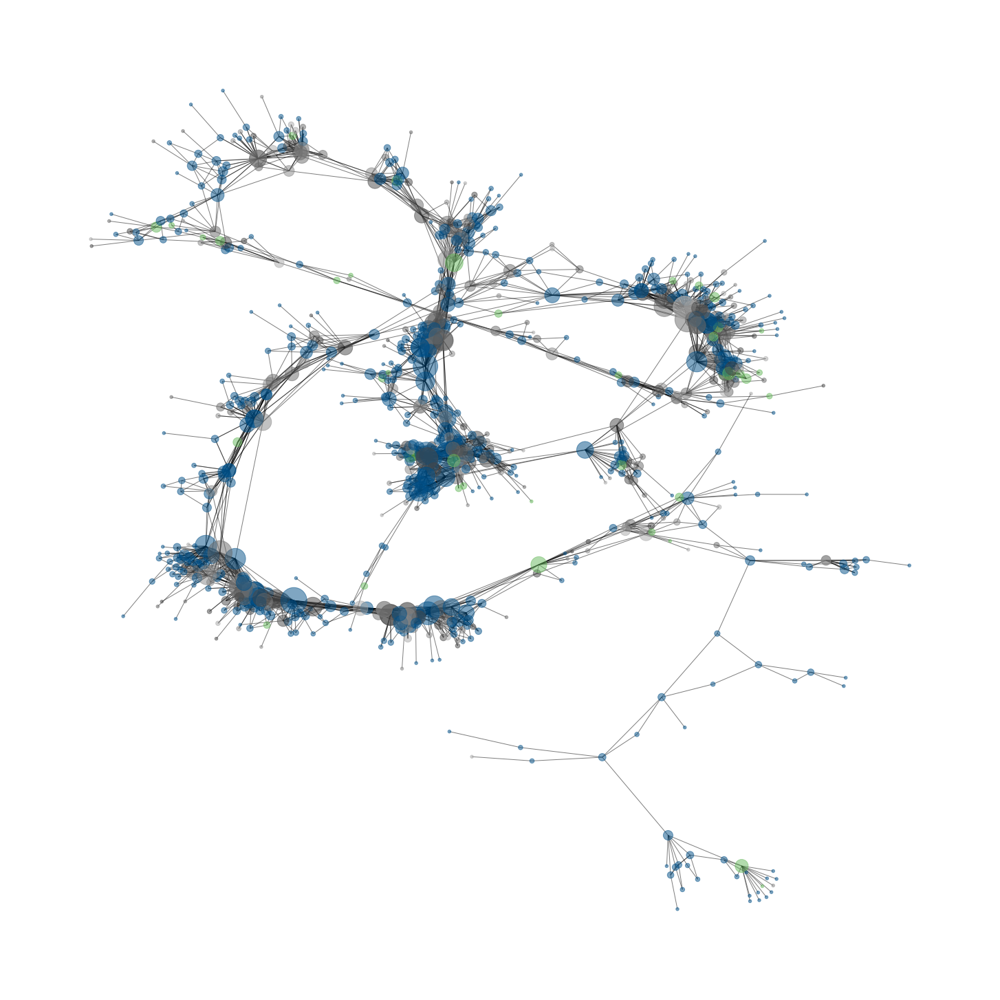

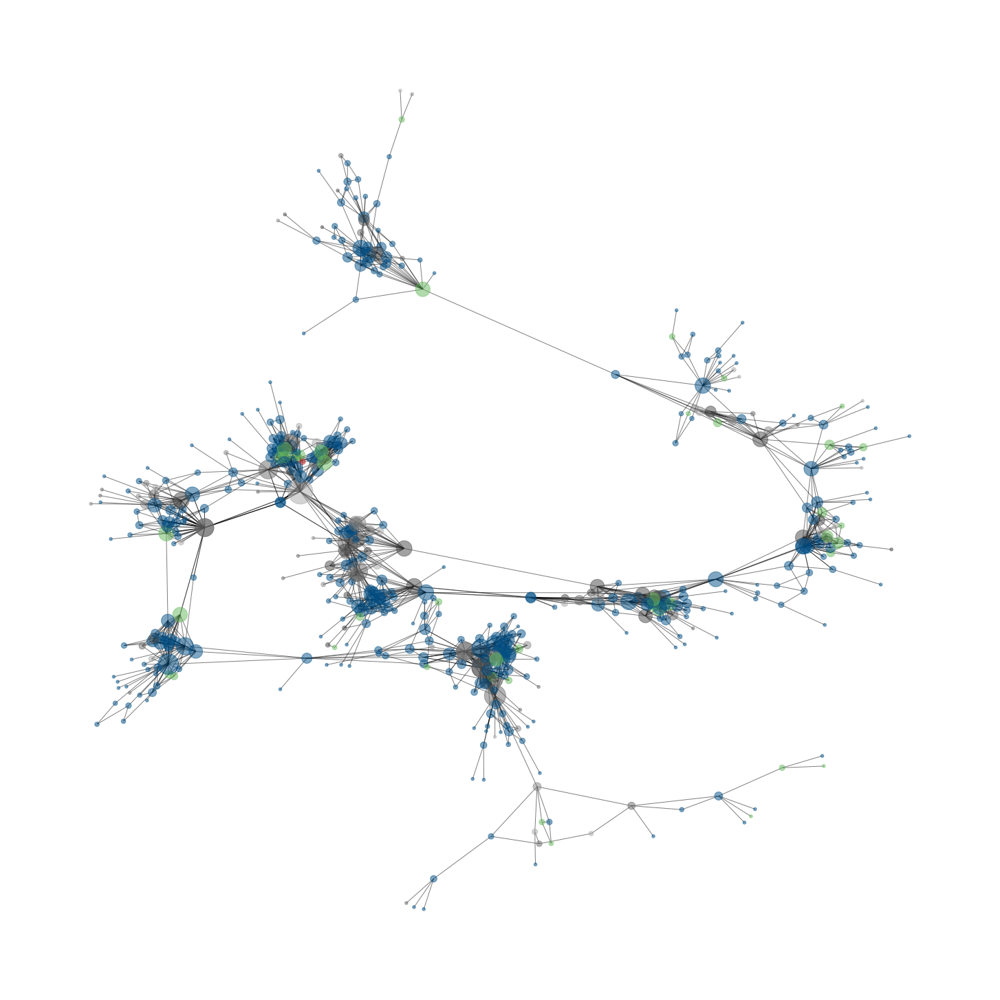

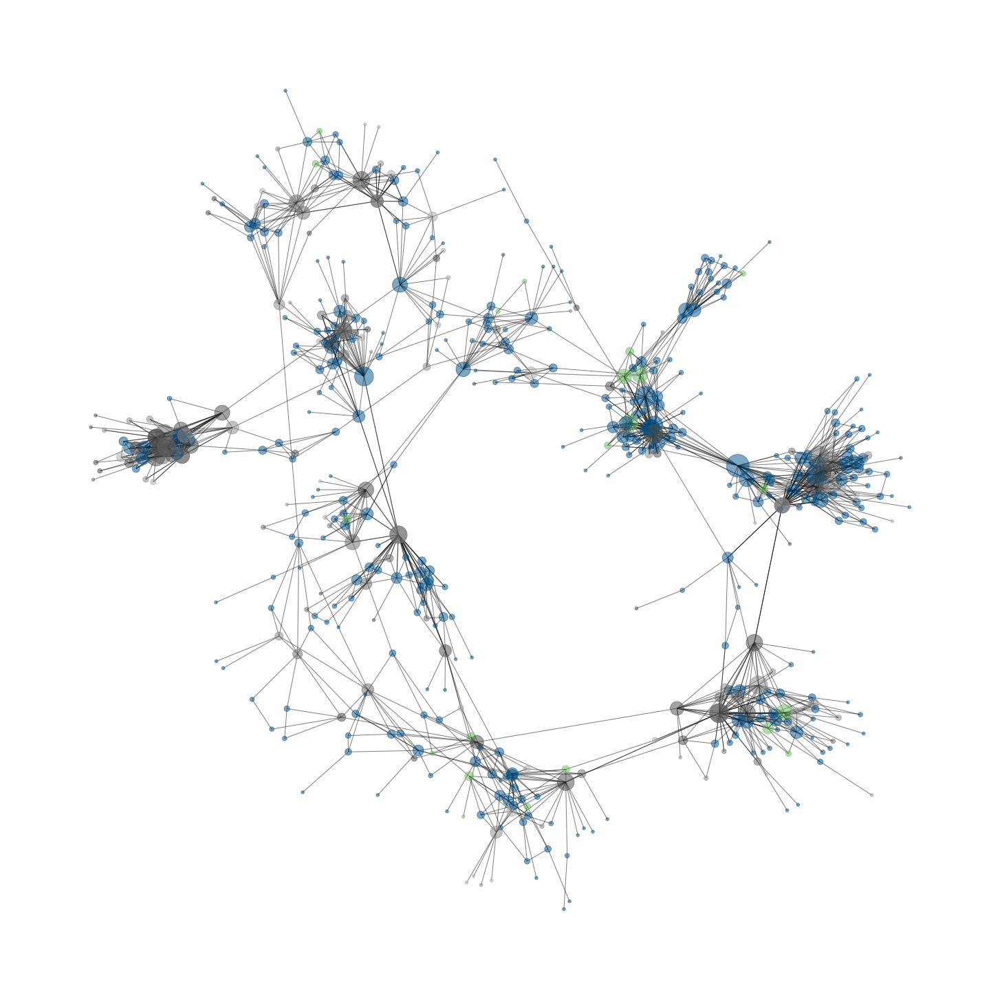

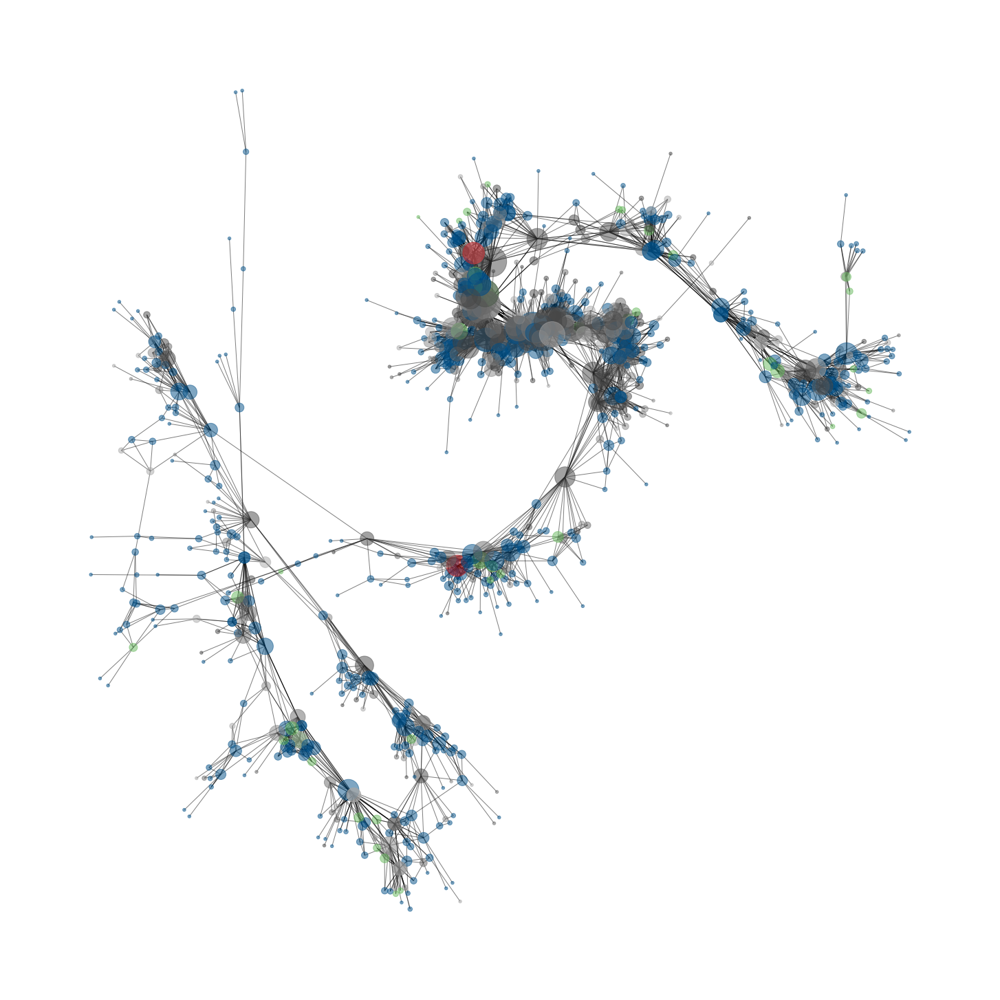

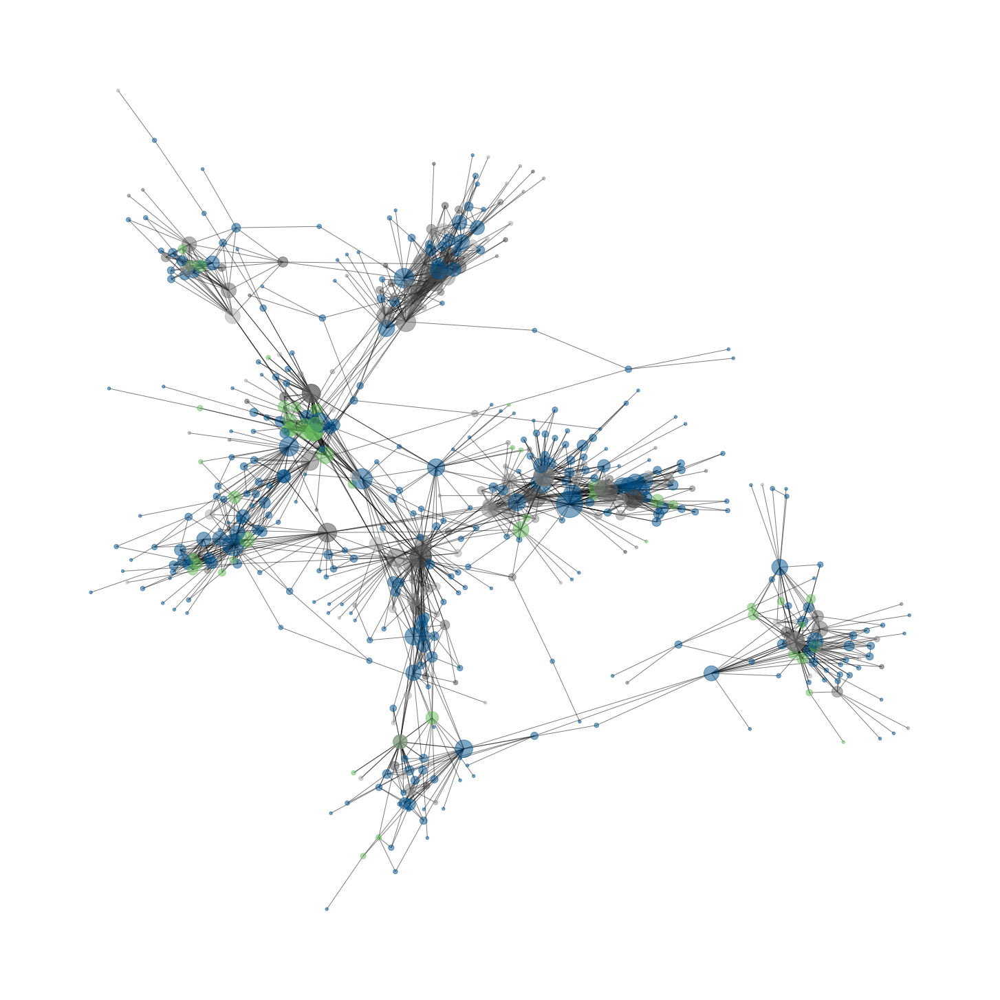

...

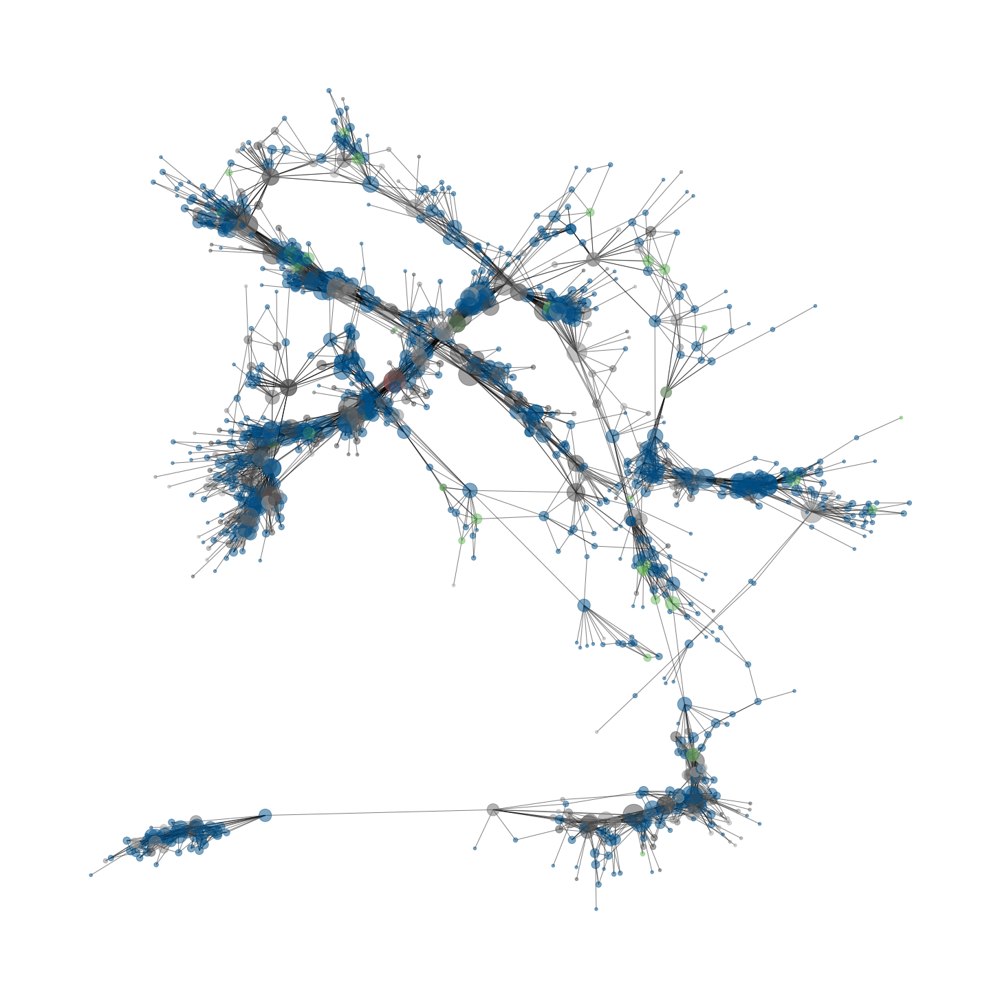

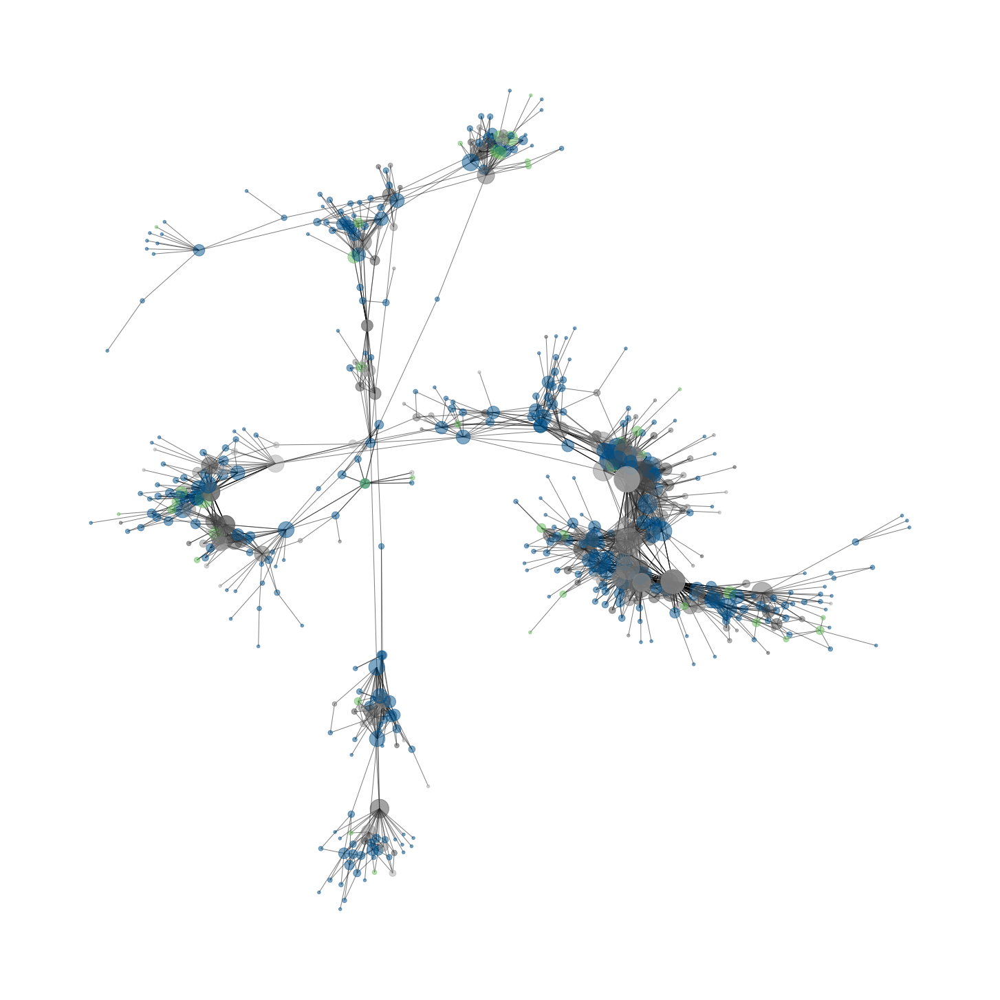

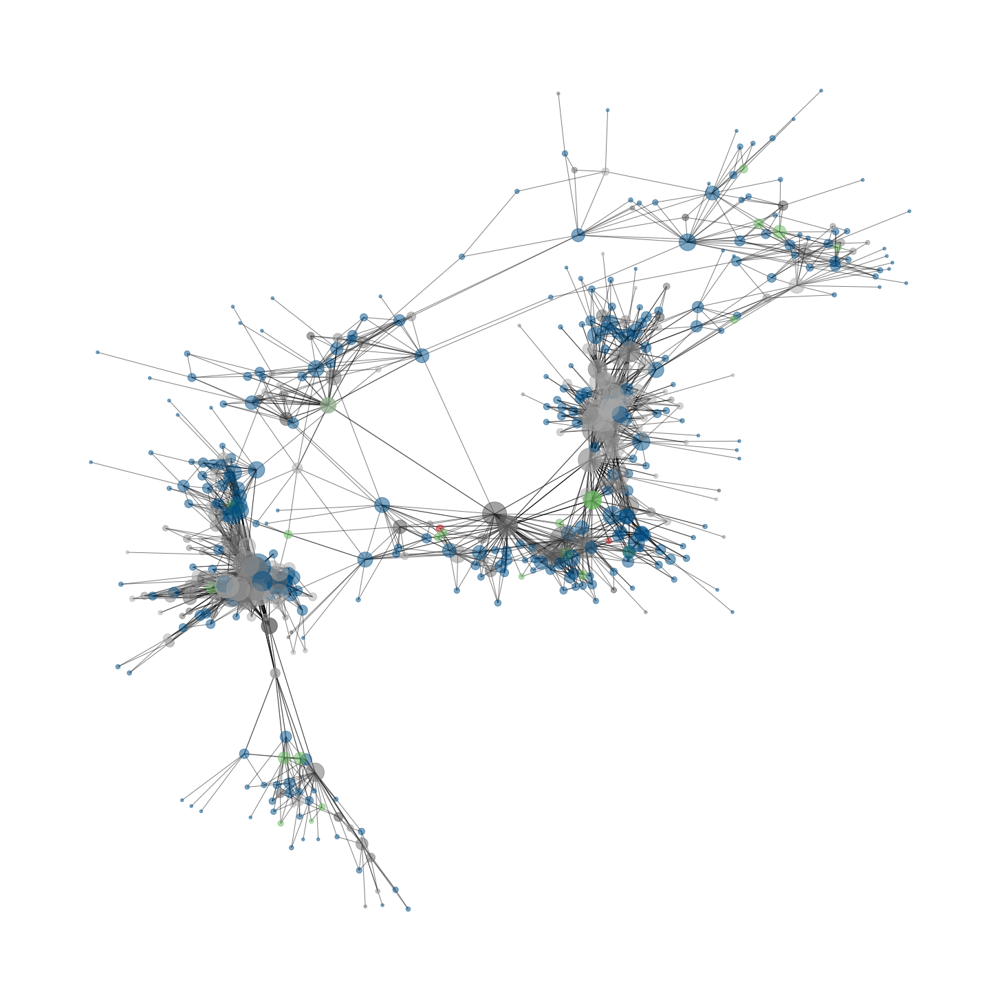

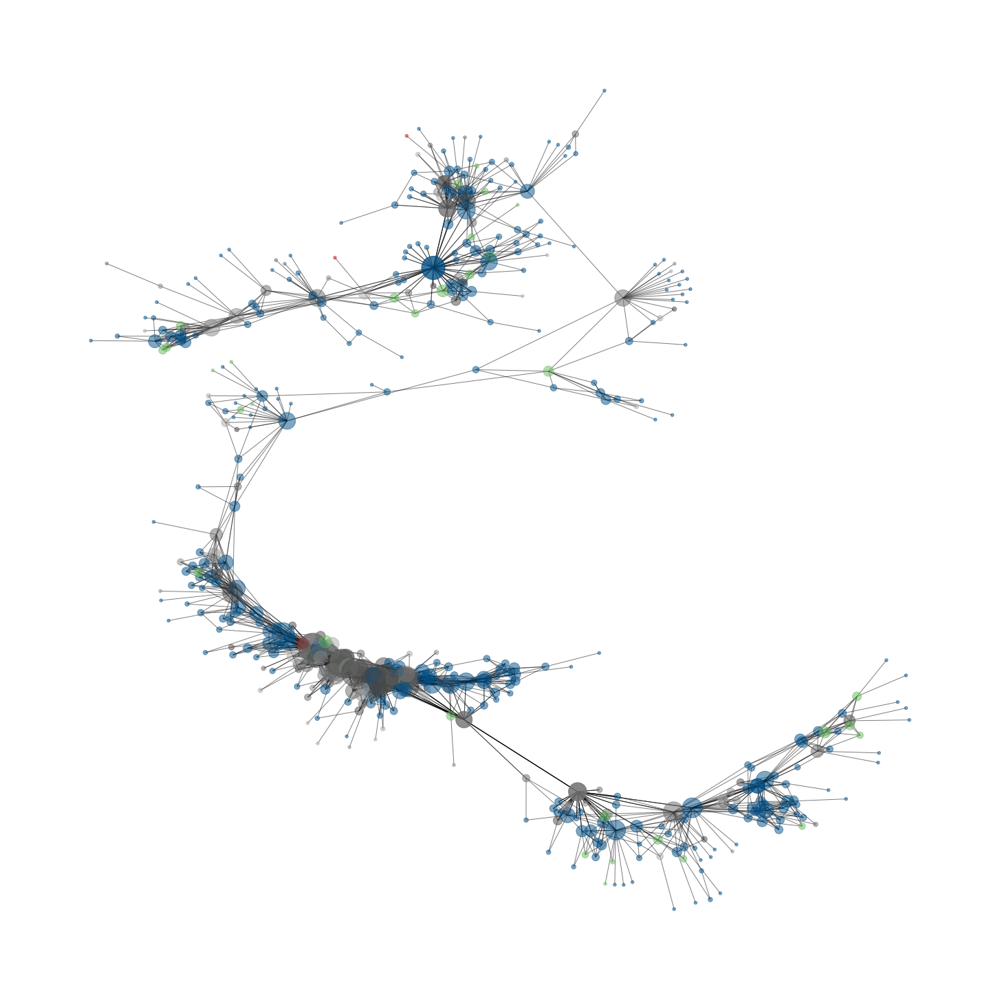

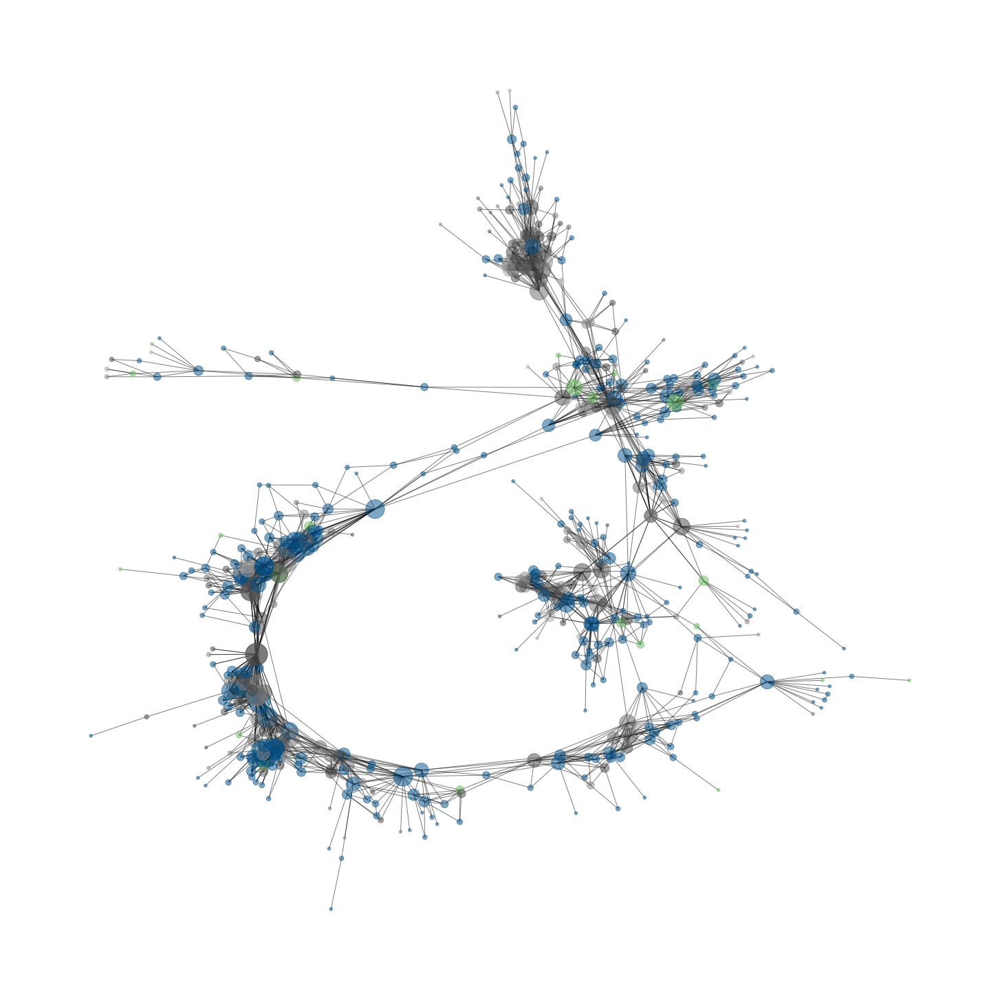

In [36]:
gs = [G.subgraph(g) for g in list(nx.connected_components(G))]

for g in gs:


    if len(g.nodes) < 500:
        continue
    

    plt.figure(figsize=[20,20])

    nx.draw(g,
            node_color=dict(g.nodes(data='color')).values(), 
            node_size=20*np.array(list(dict(g.degree()).values()))**1.1,
            alpha=0.5
        )


In [29]:
[MAPgn[i] for i in g.nodes if (i in MAPgn) and MAPcl[i] == 'ANDR']

['H1-0', 'XRCC6']

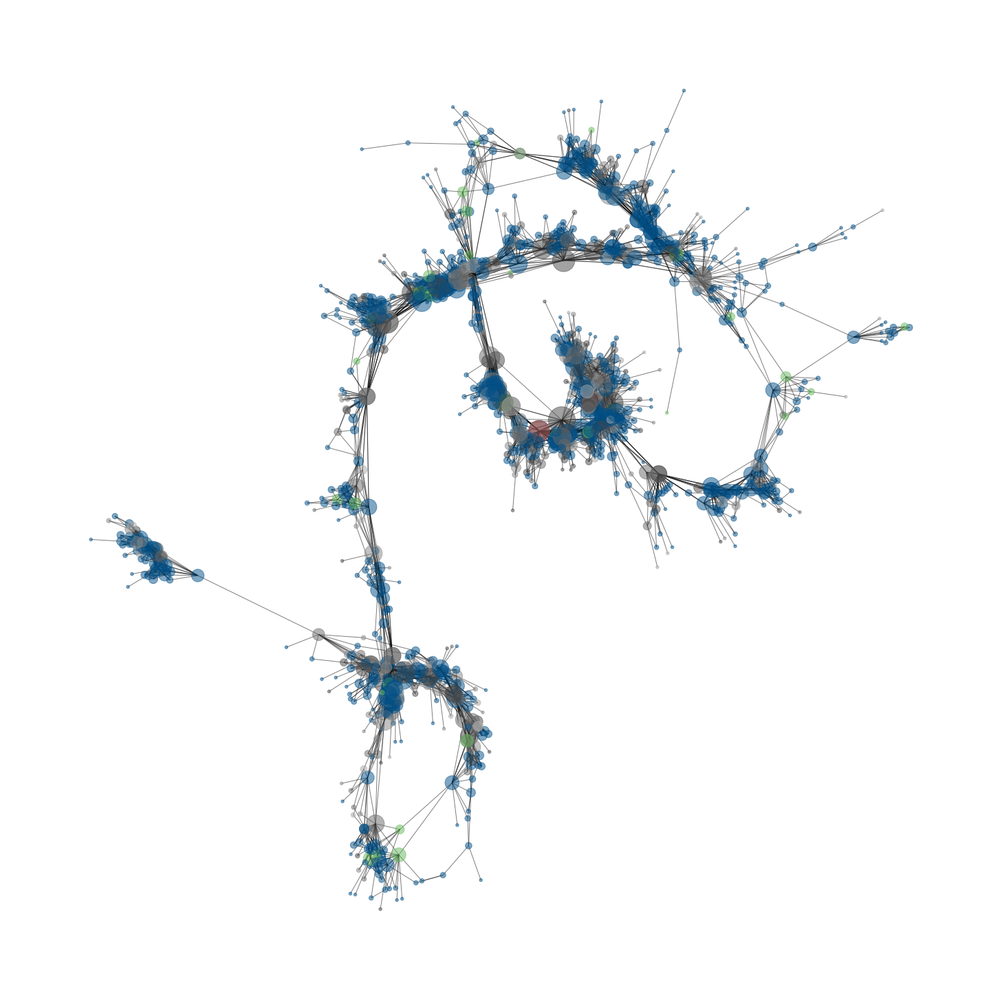

In [31]:
plt.figure(figsize=[20,20])

nx.draw(g,
        node_color=dict(g.nodes(data='color')).values(), 
        node_size=20*np.array(list(dict(g.degree()).values()))**1.1,
        alpha=0.5
    )

<AxesSubplot:ylabel='Density'>

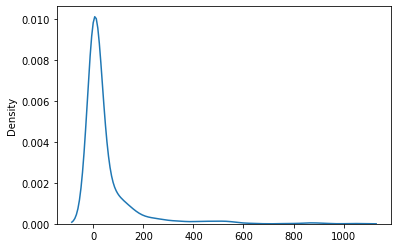

In [51]:
sns.kdeplot(
    [len(g) for g in list(nx.connected_components(G))]
)


<AxesSubplot:ylabel='Density'>

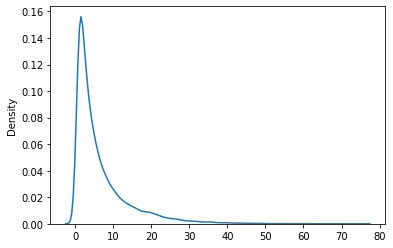

In [55]:
sns.kdeplot(
    [v for k,v in dict(G.degree()).items()]
)

In [24]:
len(MAPcl)

76789